# Adversarial Attacks

## Outline

Image classification (a.k.a., object detection) architectures are the cornerstone of most deep-neural-network-based computer vision solutions such as object localization and scene captioning. Classification architectures have achieved great successes. They are, however, known to be particularly susceptible to adversarial attacks (see this [blog post form OpenAI](https://openai.com/blog/adversarial-example-research/) for more details).

While it is well known that adversarial attacks are an inherent aspect of deep neural networks, it is important to be able to construct approximate solutions to counter or lessen the severity of adversarial attacks. The goal of this presentation here is to propose and explore such approaches to supplement the existing ones (e.g., the gradient-denying strategy).

In this notebook, I first develop a set up to construct adversarial attacks for some of the most well-known object-detection architectures. Then I try to construct solutions to counter these. Specifically, I will try to address the following questions:
 - Would a dual-network classification system be more resilient? Can we devise an adversarial attack for two networks?
 - Does sweeping (as originally done in AlexNet) rather than feeding in the whole network confer any benefits?
 - Does passing the input image trough a low-pass filter help? Can we construct adversarial artifacts?
 
## Setup

We examine five pre-trained networks on the ImageNet classification task:
 - ResNet50
 - EfficinetNet-B0
 - DenseNet-201
 - MobileNet-V2
 - NasNet-Mobile
 
We specifically refrain from exploring larger architectures such as ResNet-152 and NasNet-Large for two main reasons: First, those tend to have more capacity and likely more prone to adversarial attacks. Second, larger architectures are not feasible to deploy on resource constrained devices where most real-world applications lie.

Finally, for input images, I rely on sample images from [EliSchwartz's repository](https://github.com/EliSchwartz/imagenet-sample-images).

In [1]:
import os
import json

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

<br><br><br>

# Load Sample Images

## Utilities

In [2]:
def load_image(image_pathname: str):
    """Read image.
    
    Args:
        image_pathname: File pathname to read the image from.
        
    Returns:
        tf.Tensor
    """
    if not os.path.isfile(image_pathname):
        raise ValueError(f"\"{image_pathname}\" is not a valid file...")
    #
    file_contents = tf.io.read_file(image_pathname)
    return tf.io.decode_image(
        contents=file_contents, 
        channels=None, 
        dtype=tf.dtypes.uint8, 
        name=None,
        expand_animations=True)

def resize_image(image_tensor, target_size,
                 preserve_aspect_ratio=True, pad=False):
    """Resizes the provided image tensor to the specified size.
    
    Args:
        image_tensor (tf.Tensor): Input image tensor.
        target_size (tuple or tf.Tensor): Target image size.
        preserve_aspect_ratio (bool): If `True`, will either pad or 
            crop the image prior to resizing to preserve aspect ration.
        pad (bool): Inconsequential when `preserve_aspect_ratio` is
            `False`. If `True` will pad, otherwise crop.
    
    Returns:
        tf.Tensor
    """
    if preserve_aspect_ratio:
        image_shape_tensor = image_tensor.shape
        height = image_shape_tensor[0]
        width = image_shape_tensor[1]
        if pad:
            new_height = tf.math.maximum(height, width)
            new_width = tf.math.maximum(height, width)
            image_tensor = tf.image.pad_to_bounding_box(
                image=image_tensor, 
                offset_height=(new_height - height) // 2, 
                offset_width=(new_width - width) // 2, 
                target_height=new_height, 
                target_width=new_width)
        else:
            new_height = tf.math.minimum(height, width)
            new_width = tf.math.minimum(height, width)
            image_tensor = tf.image.crop_to_bounding_box(
                image=image_tensor, 
                offset_height=(height - new_height) // 2, 
                offset_width=(width - new_width) // 2, 
                target_height=new_height, 
                target_width=new_width)

    return tf.image.resize(
        images=image_tensor, 
        size=target_size, 
        method=tf.image.ResizeMethod.BILINEAR, 
        preserve_aspect_ratio=False,
        antialias=False)

In [3]:
def low_pass_filter(image_tensor, threshold=0.9):
    """A Fourier-transform-base low-pass filter.
    
    Args:
        image_tensor (tf.Tensor): Input image.
        threshold (float): Cutoff threshold fraction of the highest frequency.
    
    Returns:
        tf.Tensor of tf.float32
    """
    
    size = image_tensor.shape[0:-1].as_list()
    threshold *= 0.5 * np.sqrt(2.0)
    axis_0_freqs = np.tile(
        np.fft.fftfreq(size[0]), # 2.0 * np.pi * np.arange(size[0], dtype=np.float32) / size[0], 
        reps=(size[1], 1)).transpose([1, 0])
    axis_1_freqs = np.tile(
        np.fft.fftfreq(size[1]), # 2.0 * np.pi * np.arange(size[1], dtype=np.float32) / size[1], 
        reps=(size[0], 1))
    filter_mask = np.sqrt(np.square(axis_0_freqs) + np.square(axis_1_freqs))
    filter_mask = np.where(filter_mask > threshold, 0.0, 1.0)
    filter_mask_tensor = tf.constant(filter_mask, dtype=tf.complex64)
    
    image_channels = []
    image_tensor = tf.cast(image_tensor, tf.complex64)
    for idx in range(3):
        fft_image_channel = tf.signal.fft2d(image_tensor[:, :, idx])
        fft_image_channel *= filter_mask_tensor
        image_channels.append(
            tf.math.real(tf.signal.ifft2d(fft_image_channel)))
    image_tensor = tf.stack(image_channels, axis=2)
    image_tensor = tf.cast(image_tensor, tf.float32)
    return image_tensor

In [4]:
def show_images(image_list, grid_shape=(8, 8), fig_size=(18., 18.)):
    """Shows a grid of images.
    """
    if grid_shape[0] * grid_shape[1] > len(image_list):
        print(f"WARNING: The grid is larger than the number of image...")
    #
    delta_width = 1.0 / grid_shape[0] 
    delta_height = 1.0 / grid_shape[1]
    hori_margin = 0.05 * delta_width 
    vert_margin = 0.05 * delta_height
    fig = plt.figure(figsize=fig_size)
    idx = 0
    for row in range(grid_shape[0]):
        for col in range(grid_shape[1]):
            idx = row * grid_shape[0] + col
            rect = [row * delta_width + 0.5 * hori_margin, 
                    1.0 - (col + 1) * delta_height + 0.5 * vert_margin, 
                    delta_width - hori_margin, 
                    delta_height - vert_margin]
            ax = fig.add_axes(
                rect=rect, projection=None, polar=False)
            ax.spines["top"].set_visible(False)
            ax.spines["right"].set_visible(False)
            ax.spines["bottom"].set_visible(False)
            ax.spines["left"].set_visible(False)
            ax.set_xticks([])
            ax.set_yticks([])
            if idx < len(image_list):
                ax.imshow(image_list[idx], aspect="auto")
    plt.show()

## Load ImageNet Class Indices

The JSON file is based on the list [here](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a). 

In [5]:
json_file = "imagenet1000_clsidx_to_labels.json"

with open(json_file, "r") as file:
    imagenet_json = json.load(file)
    
imagenet_class_indices = dict()
for idx_str, class_name in imagenet_json.items():
    imagenet_class_indices[int(idx_str)] = class_name

# print(json.dumps(imagenet_class_indices, indent=4))

## List Image Files

In [6]:
image_dir = "imagenet-sample-images-master"
image_paths = []
for root, dirs, files in os.walk(image_dir):
    for filename in files:
        if filename.split(".")[-1] == "JPEG":
            image_paths.append(os.path.join(root, filename))
            
print(f"Number of images: {len(image_paths)}")

Number of images: 1000


## Show Sample Set

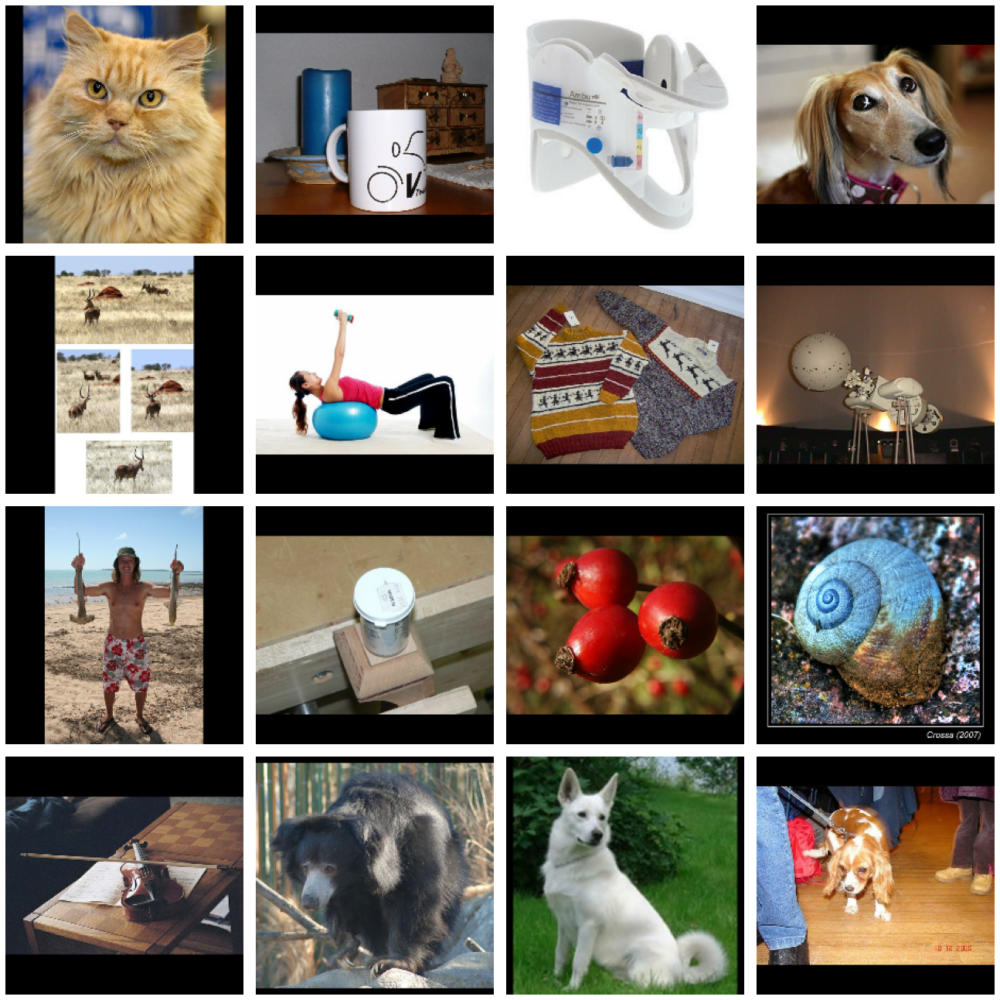

In [7]:
grid_shape = (4, 4)
random_sample = True
pad = True

num_samples = np.prod(np.array(grid_shape))
if random_sample:
    indices = np.arange(1000)
    np.random.shuffle(indices)
    indices = indices[:num_samples]
else:
    indices = np.arange(num_samples)
    
sample_images = []
for idx in indices:
    image_tensor = load_image(image_paths[idx])
    image_tensor = resize_image(image_tensor, (224, 224), 
        preserve_aspect_ratio=True, pad=pad)
    sample_images.append(image_tensor.numpy().astype(np.uint8))

show_images(sample_images, grid_shape=grid_shape)

## Down-Sampled Images

### Using FFT

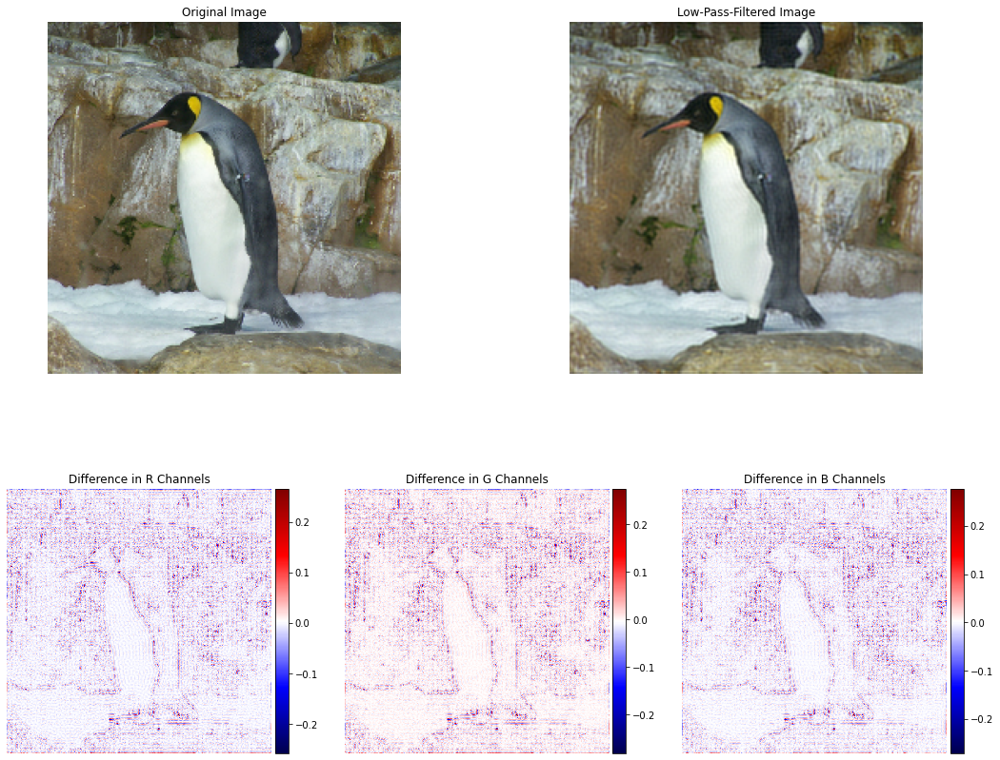

In [8]:
image_tensor = image_tensor = load_image(image_paths[145])
image_tensor = resize_image(image_tensor, (224, 224), True, pad=False)
image = image_tensor.numpy().astype(np.float32)
lp_image = low_pass_filter(image_tensor, 0.5).numpy().astype(np.float32)
lp_image = np.clip(lp_image, 0.0, 255.0)

image /= 255.0
lp_image /= 255.0


fig = plt.figure(figsize=(18, 15.))
#
ax = plt.subplot(2, 2, 1)
ax.set_title("Original Image")
ax.imshow(image)
ax.set_axis_off()
#
ax = plt.subplot(2, 2, 2)
ax.set_title("Low-Pass-Filtered Image")
ax.imshow(lp_image)
ax.set_axis_off()
#
ax = plt.subplot(2, 3, 4)
ax.set_title("Difference in R Channels")
im = ax.imshow(image[..., 0] - lp_image[..., 0], cmap="seismic")
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax =cax)
ax.set_axis_off()
#
ax = plt.subplot(2, 3, 5)
ax.set_title("Difference in G Channels")
im = ax.imshow(image[..., 1] - lp_image[..., 1], cmap="seismic")
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax =cax)
ax.set_axis_off()
#
ax = plt.subplot(2, 3, 6)
ax.set_title("Difference in B Channels")
im = ax.imshow(image[..., 2] - lp_image[..., 2], cmap="seismic")
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax =cax)
ax.set_axis_off()
#
plt.show()

### Using Resize

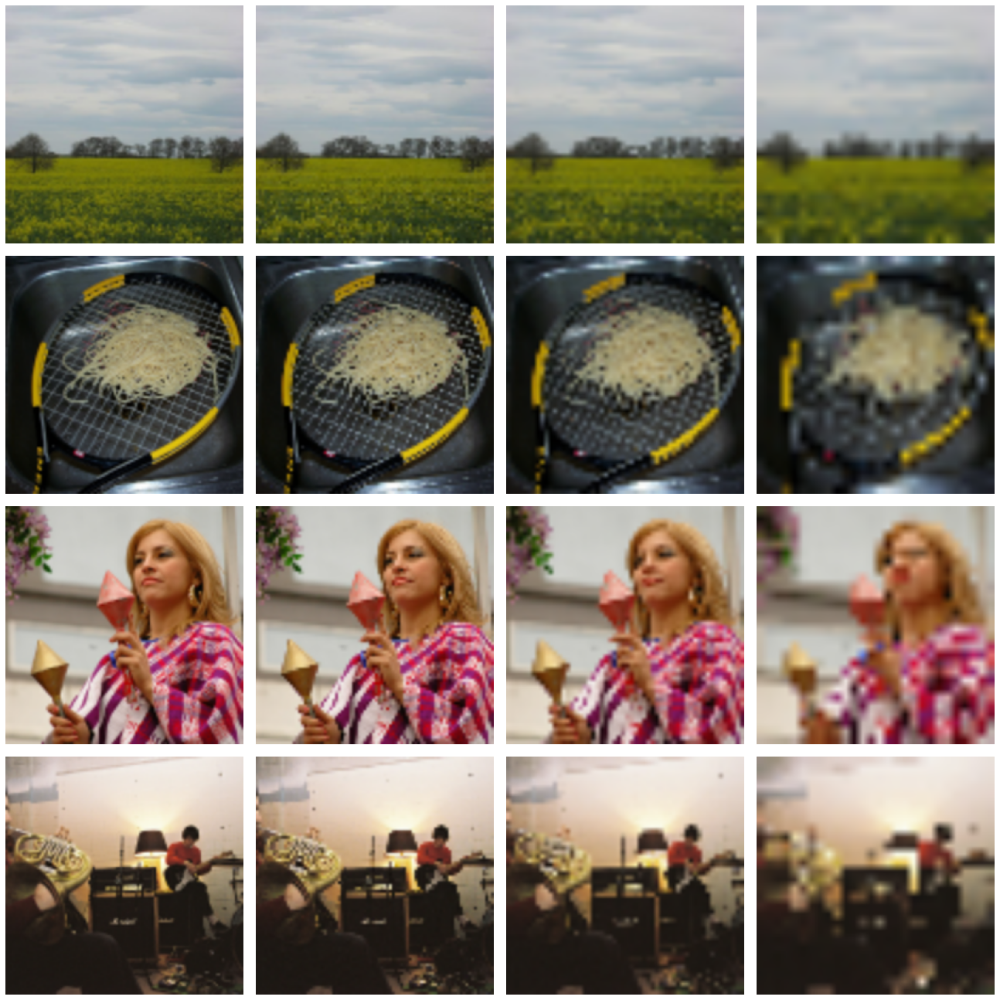

In [9]:
grid_shape = (4, 4)
random_sample = True
pad = not True
target_shape = (224, 224)

num_samples = grid_shape[0]
if random_sample:
    indices = np.arange(1000)
    np.random.shuffle(indices)
    indices = indices[:num_samples]
else:
    indices = np.arange(num_samples)

sample_images = []
for scale in reversed(range(1, grid_shape[1] + 1)):
    for idx in indices:
        image_tensor = load_image(image_paths[idx])
        image_tensor = resize_image(image_tensor, target_shape, 
            preserve_aspect_ratio=True, pad=pad)
        down_sampled_shape = (
            scale * target_shape[0] // (2 * grid_shape[1]), 
            scale * target_shape[1] // (2 * grid_shape[1]))
        image_tensor = resize_image(image_tensor, down_sampled_shape, 
            preserve_aspect_ratio=True, pad=pad)
        image_tensor = resize_image(image_tensor, target_shape, 
            preserve_aspect_ratio=True, pad=pad)
        sample_images.append(image_tensor.numpy().astype(np.uint8))

show_images(sample_images, grid_shape=grid_shape)

## Diagonal Strides

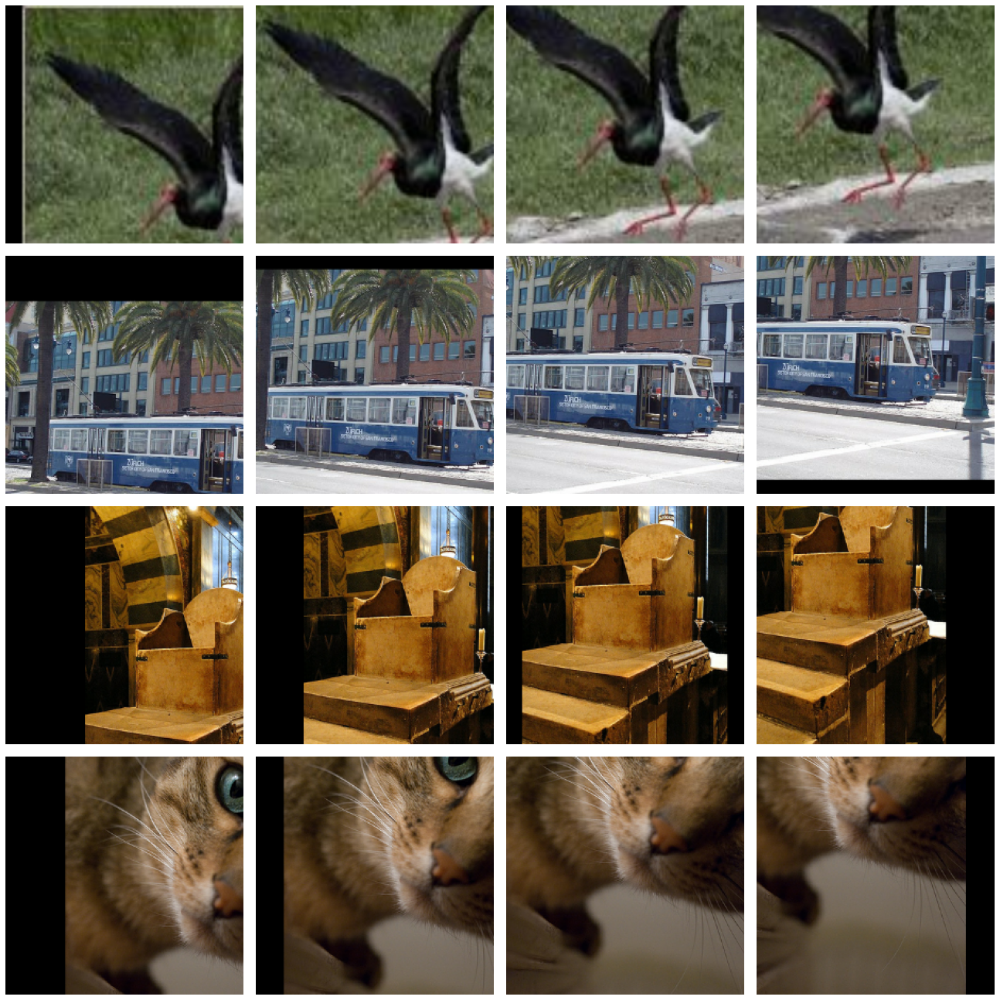

In [10]:
grid_shape = (4, 4)
random_sample = True
pad = True
target_shape = (224, 224)
stride_size = 30

num_diagonal_strides = grid_shape[1]
num_samples = grid_shape[0]
if random_sample:
    indices = np.arange(1000)
    np.random.shuffle(indices)
    indices = indices[:num_samples]
else:
    indices = np.arange(num_samples)

sample_images = []
size = (target_shape[0] + stride_size * num_diagonal_strides, 
        target_shape[1] + stride_size * num_diagonal_strides)
for slice_idx in range(num_diagonal_strides): 
    for idx in indices:
        image_tensor = load_image(image_paths[idx])
        image_tensor = resize_image(image_tensor, size, 
            preserve_aspect_ratio=True, pad=pad)
        sample_images.append(tf.slice(
            image_tensor, 
            begin=[slice_idx * stride_size, slice_idx * stride_size, 0], 
            size=[*target_shape, 3]).numpy().astype(np.uint8))

# # Forming the stack of 
# splits = []
# for idx in range(num_diagonal_strides): 
#     splits.append(
#         tf.slice(image_tensor, 
#                  begin=[idx * stride_size, idx * stride_size, 0], 
#                  size=image_target_size))
# image_tensor = tf.stack(splits, axis=0)  # stack along the first (batch) axis

show_images(sample_images, grid_shape=grid_shape)

<br><br><br>

# Load Pre-Trained Models

In [11]:
models = {}
model_preprocessors = {}
model_inverse_preprocessors = {}

## ResNet-50

Note that ResNet models expect an input preprocessed in the Caffe style: [GBR, channel-wise sample-zeroed](https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet/preprocess_input#returns) image. 

In [12]:
models["resnet50"] = tf.keras.applications.ResNet50(
    include_top=True, 
    weights="imagenet", 
    input_tensor=None, 
    input_shape=None,
    pooling=None, 
    classes=1000)

In [13]:
def resnet_preprocessor(rgb_image):
    if isinstance(rgb_image, np.ndarray):
        return tf.keras.applications.resnet.preprocess_input(np.copy(rgb_image))
    else:
        return tf.keras.applications.resnet.preprocess_input(rgb_image)

model_preprocessors["resnet50"] = resnet_preprocessor

In [14]:
def resnet_inverse_preprocessor(gbr_image):
    rgb_means = [123.68, 116.779, 103.939]
    image = gbr_image[..., ::-1]  # GBR to RGB
    for idx, mean in enumerate(rgb_means):
        image[:, :, idx] += mean
    return image

model_inverse_preprocessors["resnet50"] = resnet_inverse_preprocessor

## EfficientNet-B0

EfficientNets accept images in the original 8-bit RGB format.

In [15]:
models["efficientnetb0"] = tf.keras.applications.EfficientNetB0(
    include_top=True, 
    weights="imagenet", 
    input_tensor=None, 
    input_shape=None,
    pooling=None, 
    classes=1000)

In [16]:
model_preprocessors["efficientnetb0"] = (lambda rgb_image: rgb_image)

In [17]:
model_inverse_preprocessors["efficientnetb0"] = (lambda rgb_image: rgb_image)

## DenseNet-201

Inputs are expected to be in the range 0.0 to 1.0 and normalization is w.r.t. the ImageNet dataset as described [here](https://www.tensorflow.org/api_docs/python/tf/keras/applications/densenet/preprocess_input#returns).

In [18]:
models["densenet201"] = tf.keras.applications.DenseNet201(
    include_top=True, 
    weights="imagenet", 
    input_tensor=None, 
    input_shape=None,
    pooling=None, 
    classes=1000)

In [19]:
def densnet_preprocessor(rgb_image):
    return tf.keras.applications.densenet.preprocess_input(rgb_image)  

model_preprocessors["densenet201"] = densnet_preprocessor

In [20]:
def densnet_inverse_preprocessor(image):
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    for idx in range(3): 
        image[:, :, idx] *= std[idx] 
        image[:, :, idx] += mean[idx]
        image[:, :, idx] *= 255.0
    return image

model_inverse_preprocessors["densenet201"] = densnet_inverse_preprocessor

## MobileNet-V2

In [21]:
models["mobilenetv2"] = tf.keras.applications.MobileNetV2(
    input_shape=None, 
    alpha=1.0, 
    include_top=True, 
    weights="imagenet", 
    input_tensor=None, 
    pooling=None, 
    classes=1000,
    classifier_activation="softmax")

In [22]:
model_preprocessors["mobilenetv2"] = lambda rgb_image: (rgb_image/127.5 - 1.0)

In [23]:
model_inverse_preprocessors["mobilenetv2"] = lambda x: 127.5 * (x + 1.0)

## NASNetMobile

In [24]:
models["nasnetmobile"] = tf.keras.applications.NASNetMobile(
    input_shape=None, 
    include_top=True, 
    weights="imagenet", 
    input_tensor=None, 
    pooling=None, 
    classes=1000)

In [25]:
model_preprocessors["nasnetmobile"] = model_preprocessors["mobilenetv2"]

In [26]:
model_inverse_preprocessors["nasnetmobile"] = model_inverse_preprocessors["mobilenetv2"]

## Test Models:

In [27]:
for name, model in models.items():
    print(f"\t{name.capitalize():24}{model.inputs[0].shape}")

	Resnet50                (None, 224, 224, 3)
	Efficientnetb0          (None, 224, 224, 3)
	Densenet201             (None, 224, 224, 3)
	Mobilenetv2             (None, 224, 224, 3)
	Nasnetmobile            (None, 224, 224, 3)


	Resnet50         "pelican" [144]: 0.9999985694885254
	Efficientnetb0   "pelican" [144]: 0.9095034003257751
	Densenet201      "pelican" [144]: 0.9999271631240845
	Mobilenetv2      "pelican" [144]: 0.980383038520813
	Nasnetmobile     "pelican" [144]: 0.9442554712295532


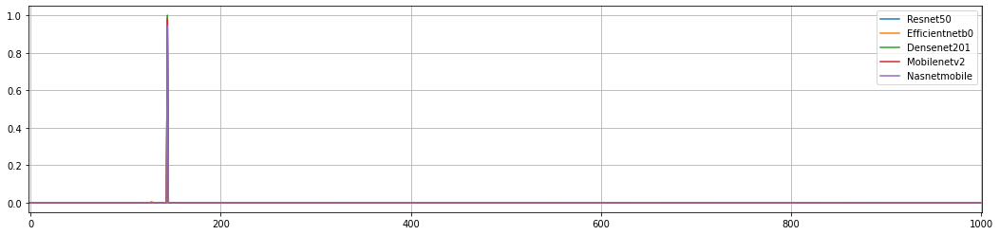

In [28]:
image_tensor = load_image(image_paths[144])
image_tensor = resize_image(image_tensor, (224, 224), True, True)
input_image = image_tensor.numpy()[np.newaxis, :, :, :] 

fig = plt.figure(figsize=(18., 4.))
plot_num = 1
for num, model_name in enumerate(models, start=1):
    predictions = models[model_name].predict(
        model_preprocessors[model_name](np.copy(input_image))
    )[0]
    plt.plot(predictions, label=model_name.capitalize())
    pred_idx = np.argmax(predictions)
    print(f"\t{model_name.capitalize() :16} \"{imagenet_class_indices[pred_idx]}\" [{pred_idx}]: {np.amax(predictions)}")
plt.xlim(-2, 1001)
plt.legend()
plt.grid()
plt.gca().set_axisbelow(True)
plt.show()

## Test preprocessors and their inverses

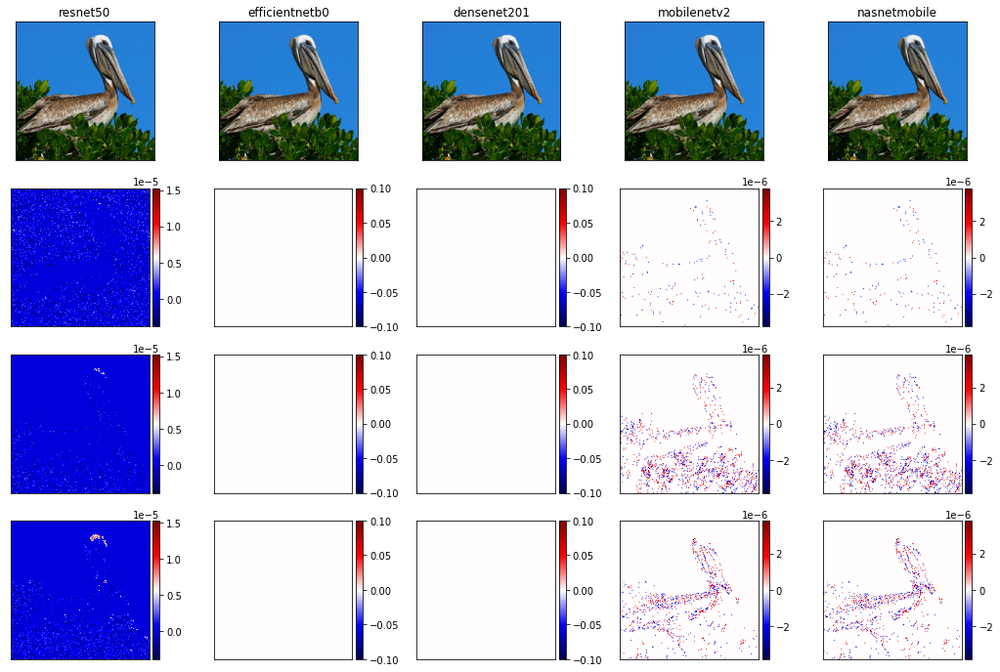

In [29]:
# test_image = np.random.randint(255, size=(224, 224, 3), dtype=np.uint8)
image_tensor = load_image(image_paths[144])
image_tensor = resize_image(image_tensor, (224, 224), True, False)
test_image = image_tensor.numpy().astype(np.float32)

fig = plt.figure(figsize=(18., 12.))
for num, model_name in enumerate(models, start=1):
    reconstructed_image = model_inverse_preprocessors[model_name](
            model_preprocessors[model_name](test_image)).astype(np.float32)
    delta_image = test_image - reconstructed_image
    #
    ax = plt.subplot(4, len(models), num)
    ax.set_title(model_name)
    ax.imshow(reconstructed_image.astype(np.uint8))
    ax.set_xticks([])
    ax.set_yticks([])
    #
    ax = plt.subplot(4, len(models), len(models) + num)
    im = ax.imshow(delta_image[..., 0], cmap="seismic")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(im, cax =cax)
    ax.set_xticks([])
    ax.set_yticks([])
    #
    ax = plt.subplot(4, len(models), 2 * len(models) + num)
    im = ax.imshow(delta_image[..., 1], cmap="seismic")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(im, cax =cax)
    ax.set_xticks([])
    ax.set_yticks([])
    #
    ax = plt.subplot(4, len(models), 3 * len(models) + num)
    im = ax.imshow(delta_image[..., 2], cmap="seismic")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(im, cax =cax)
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

<br><br><br>

# Construct an Adversarial Image

## Visualize Gradients Based on a Flat Input for ResNet50:

In [30]:
target_class_index = 145
print(f"Target Class: \"{imagenet_class_indices[target_class_index]}\" [{target_class_index}]")

loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)

def step(x, class_idx, lr):
    with tf.GradientTape(persistent=False, watch_accessed_variables=True) as tape:
        tape.reset()
        tape.watch(x)
        predictions = models["resnet50"](x)
        ce = loss(y_true=class_idx, y_pred=predictions)
    g = tape.gradient(target=ce, sources=x, unconnected_gradients=tf.UnconnectedGradients.ZERO)
    x = x - lr * g 
    return (x, ce)
        
image = 0.01 * np.ones((1, 224, 224, 3))
x = tf.Variable(
    initial_value=image, 
    dtype=tf.float32, name="input")

idx = 0
ce = 1.0
learning_rate = 100.0
while ce > 0.1:
    idx += 1
    x, ce = step(
        x=x, 
        class_idx=tf.constant(target_class_index, dtype=tf.int32), 
        lr=tf.constant(learning_rate, dtype=tf.float32))
    print(f"\t[{idx}] {ce.numpy()}", end="\r")

Target Class: "king penguin, Aptenodytes patagonica" [145]


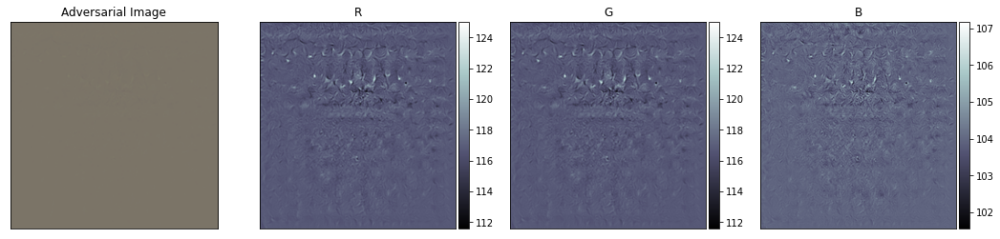

In [31]:
adversarial_image = model_inverse_preprocessors["resnet50"](x[0, ...].numpy()).astype(np.float32)
adversarial_image = np.clip(adversarial_image, 0.0, 255.0)

fig = plt.figure(figsize=(18., 4.))
#
ax = plt.subplot(1, 4, 1)
ax.set_title("Adversarial Image")
ax.imshow(adversarial_image.astype(np.uint8))
ax.set_xticks([])
ax.set_yticks([])
#
ax = plt.subplot(1, 4, 2)
ax.set_title("R")
im = ax.imshow(adversarial_image[..., 1], cmap="bone", aspect="auto")
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax =cax)
ax.set_xticks([])
ax.set_yticks([])
#
ax = plt.subplot(1, 4, 3)
ax.set_title("G")
im = ax.imshow(adversarial_image[..., 1], cmap="bone", aspect="auto")
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax =cax)
ax.set_xticks([])
ax.set_yticks([])
#
ax = plt.subplot(1, 4, 4)
ax.set_title("B")
im = ax.imshow(adversarial_image[..., 2], cmap="bone", aspect="auto")
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax =cax)
ax.set_xticks([])
ax.set_yticks([])
#
plt.show()

	Resnet50                 "king penguin, Aptenodytes patagonica" [145]: 0.9949434399604797
	Efficientnetb0           "cello, violoncello" [486]: 0.0012430550996214151
	Densenet201              "consomme" [925]: 0.017455585300922394
	Mobilenetv2              "wall clock" [892]: 0.09385403990745544
	Nasnetmobile             "letter opener, paper knife, paperknife" [623]: 0.012353037483990192


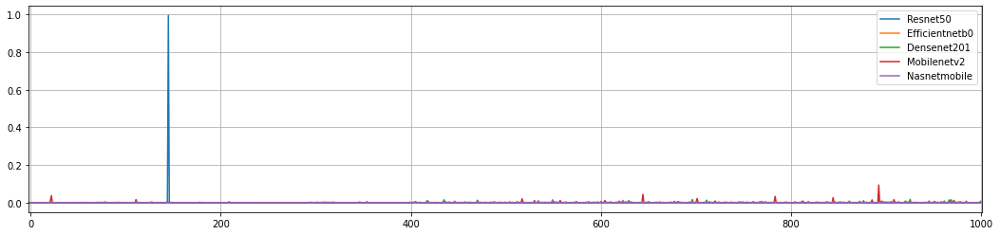

In [32]:
fig = plt.figure(figsize=(18., 4.))
plot_num = 1
for num, model_name in enumerate(models, start=1):
    predictions = models[model_name].predict(
        model_preprocessors[model_name](np.copy(adversarial_image))[np.newaxis, :, :, :]
    )[0]
    plt.plot(predictions, label=model_name.capitalize())
    pred_idx = np.argmax(predictions)
    print(f"\t{model_name.capitalize() :24} \"{imagenet_class_indices[pred_idx]}\" [{pred_idx}]: {np.amax(predictions)}")
plt.xlim(-2, 1001)
plt.legend()
plt.grid()
plt.gca().set_axisbelow(True)
plt.show()

<br><br><br>

# Devise an Adverserial Attack

In [33]:
image_tensor = load_image(image_paths[145])
image_tensor = resize_image(image_tensor, (224, 224), True, False)

predictions = models["resnet50"].predict(
    model_preprocessors["resnet50"](image_tensor.numpy())[np.newaxis,:,:,:])

for pred_idx in np.argsort(predictions)[0, -1:-6:-1].tolist():
    print(f"\t[{str(pred_idx):>3}] {imagenet_class_indices[pred_idx] :40} {predictions[0, pred_idx]}")

	[145] king penguin, Aptenodytes patagonica     0.9999982118606567
	[ 96] toucan                                   2.233300477882949e-07
	[150] sea lion                                 2.2293721713140258e-07
	[146] albatross, mollymawk                     1.0703604402806377e-07
	[649] megalith, megalithic structure           1.0471642042375606e-07


In [34]:
target_class_index = np.argsort(predictions)[0, -5]
print(f"Target Index: \"{imagenet_class_indices[target_class_index]}\" [{target_class_index}]")

loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)

def step(x, class_idx, lr):
    with tf.GradientTape(persistent=False, watch_accessed_variables=True) as tape:
        tape.reset()
        tape.watch(x)
        predictions = models["resnet50"](x)
        ce = loss(y_true=class_idx, y_pred=predictions)
    g = tape.gradient(target=ce, sources=x, unconnected_gradients=tf.UnconnectedGradients.ZERO)
    x = x - lr * g 
    return (x, ce)
        
x = tf.Variable(
    initial_value=model_preprocessors["resnet50"](image_tensor.numpy())[np.newaxis,:,:,:], 
    dtype=tf.float32, name="input")

idx = 0
ce = 1.0
learning_rate = 10.0
while ce > 0.25:
    idx += 1
    x, ce = step(
        x=x, 
        class_idx=tf.constant(target_class_index, dtype=tf.int32), 
        lr=tf.constant(learning_rate, dtype=tf.float32))
    print(f"\t[{idx}] {ce.numpy()}", end="\r")

Target Index: "megalith, megalithic structure" [649]


In [35]:
predictions = models["resnet50"].predict(x.numpy())

for pred_idx in np.argsort(predictions)[0, -1:-5:-1].tolist():
    print(f"\t[{str(pred_idx):>3}] {imagenet_class_indices[pred_idx] :40} {predictions[0, pred_idx]}")

	[649] megalith, megalithic structure           0.7798339128494263
	[145] king penguin, Aptenodytes patagonica     0.1646977663040161
	[825] stone wall                               0.008949894458055496
	[972] cliff, drop, drop-off                    0.007188243791460991


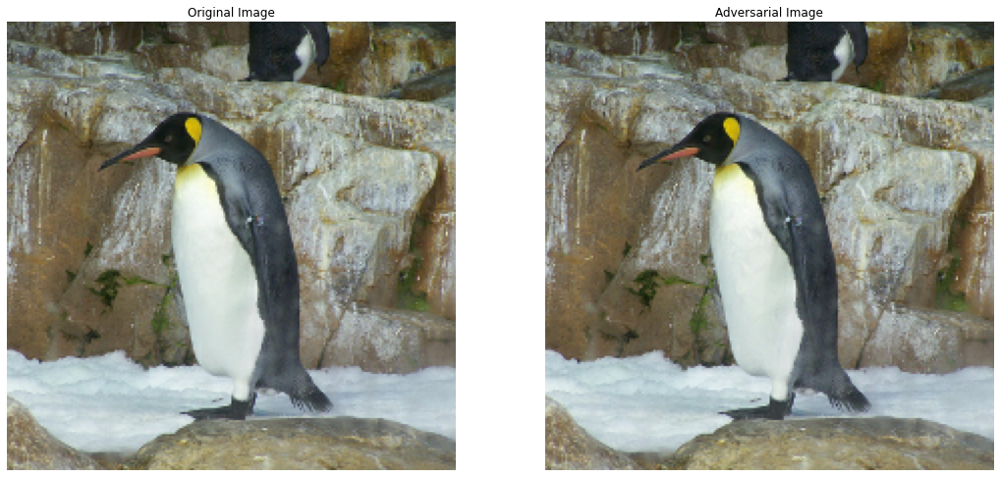

In [36]:
original_image = model_inverse_preprocessors["resnet50"](
    model_preprocessors["resnet50"](image_tensor.numpy()))
modified_image = model_inverse_preprocessors["resnet50"](x.numpy()[0,...])

fig = plt.figure(figsize=(18., 9.))
ax = plt.subplot(1, 2, 1)
ax.set_title("Original Image")
ax.imshow(original_image.astype(np.uint8))
ax.set_axis_off()
#
ax = plt.subplot(1, 2, 2)
ax.set_title("Adversarial Image")
ax.imshow(modified_image.astype(np.uint8))
ax.set_axis_off()

plt.show()

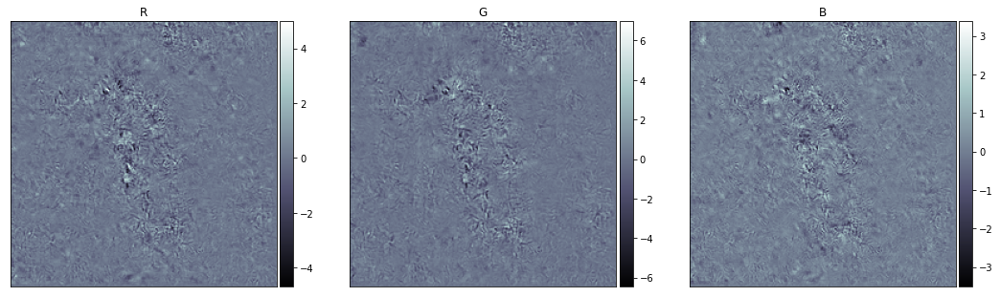

In [37]:
delta = modified_image - original_image

fig = plt.figure(figsize=(18., 6.))
#
ax = plt.subplot(1, 3, 1)
ax.set_title("R")
im = ax.imshow(delta[:,:,0], cmap="bone")
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax =cax)
ax.set_xticks([])
ax.set_yticks([])
#
ax = plt.subplot(1, 3, 2)
ax.set_title("G")
im = ax.imshow(delta[:,:,1], cmap="bone")
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax =cax)
ax.set_xticks([])
ax.set_yticks([])
#
ax = plt.subplot(1, 3, 3)
ax.set_title("B")
im = ax.imshow(delta[:,:,2], cmap="bone")
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(im, cax =cax)
ax.set_xticks([])
ax.set_yticks([])
#
plt.show()

<br><br><br>

# Defensive Approaches

## Down-Sample the Tweaked Image

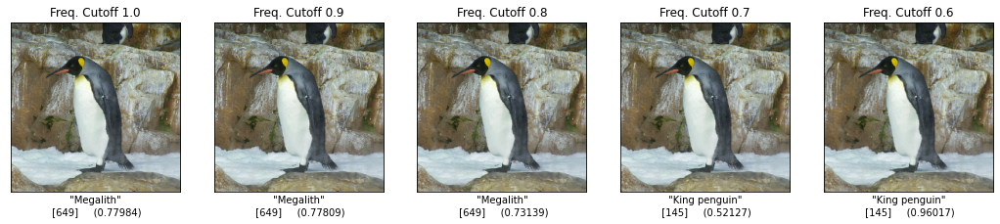

In [38]:
fig = plt.figure(figsize=(18., 6.))
for num, threshold in enumerate([1.0, 0.9, 0.8, 0.7, 0.6], start=1):
    image = x[0,...].numpy().astype(np.float32)
    lp_image = low_pass_filter(x[0,...], threshold).numpy().astype(np.float32)
    predictions = models["resnet50"].predict(lp_image[np.newaxis])
    #
    ax = plt.subplot(1, 5, num)
    ax.set_title(f"Freq. Cutoff {threshold}")
    ax.imshow(
        np.clip(model_inverse_preprocessors["resnet50"](lp_image), 0.0, 255.0).astype(np.uint8))
    ax.set_xticks([])
    ax.set_yticks([])
    pred_idx = np.argmax(predictions[0,...])
    ax.set_xlabel(f"\"{imagenet_class_indices[pred_idx].split(',')[0].capitalize()}\"\n [{pred_idx}] \
    ({round(float(predictions[0, pred_idx]), 5)})")
plt.show()

## Inference Using Other Architectures:

	Resnet50                 "megalith, megalithic structure" [649]: 0.779833972454071
	Efficientnetb0           "king penguin, Aptenodytes patagonica" [145]: 0.9239090085029602
	Densenet201              "king penguin, Aptenodytes patagonica" [145]: 0.994403600692749
	Mobilenetv2              "king penguin, Aptenodytes patagonica" [145]: 0.9577710628509521
	Nasnetmobile             "king penguin, Aptenodytes patagonica" [145]: 0.9039868116378784


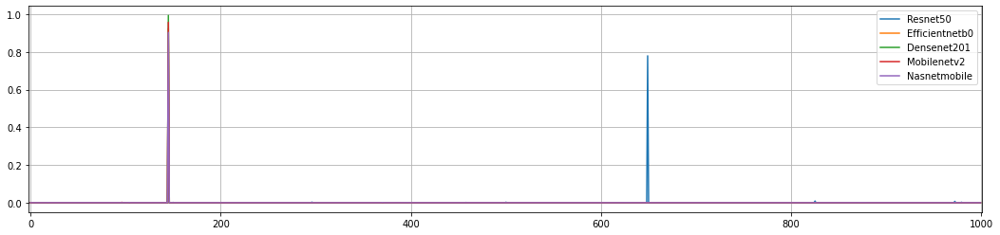

In [39]:
adversarial_image = model_inverse_preprocessors["resnet50"](x.numpy()[0,...])

fig = plt.figure(figsize=(18., 4.))
plot_num = 1
for num, model_name in enumerate(models, start=1):
    predictions = models[model_name].predict(
        model_preprocessors[model_name](np.copy(adversarial_image))[np.newaxis, :, :, :]
    )[0]
    plt.plot(predictions, label=model_name.capitalize())
    pred_idx = np.argmax(predictions)
    print(f"\t{model_name.capitalize() :24} \"{imagenet_class_indices[pred_idx]}\" [{pred_idx}]: {np.amax(predictions)}")
plt.xlim(-2, 1001)
plt.legend()
plt.grid()
plt.gca().set_axisbelow(True)
plt.show()